<a href="https://colab.research.google.com/github/anikagupte9-droid/deposit/blob/main/DA_IA2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.5 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

Sampling points for water...

Sampling points for agriculture...

Sampling points for urban...
Ultralytics 8.3.225 🚀 Python-3.12.12 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/sat_dataset/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.

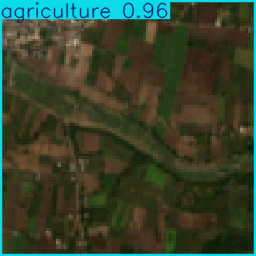

Predicting on: /content/sat_dataset/images/val/urban/urban_44.png

image 1/1 /content/sat_dataset/images/val/urban/urban_44.png: 256x256 1 water, 1 urban, 57.5ms
Speed: 0.9ms preprocess, 57.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 256)


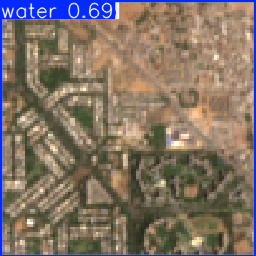

Predicting on: /content/sat_dataset/images/val/agriculture/agriculture_22.png

image 1/1 /content/sat_dataset/images/val/agriculture/agriculture_22.png: 256x256 1 agriculture, 63.9ms
Speed: 1.1ms preprocess, 63.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 256)


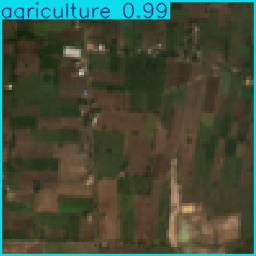

Predicting on: /content/sat_dataset/images/val/urban/urban_34.png

image 1/1 /content/sat_dataset/images/val/urban/urban_34.png: 256x256 1 urban, 63.8ms
Speed: 1.8ms preprocess, 63.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 256)


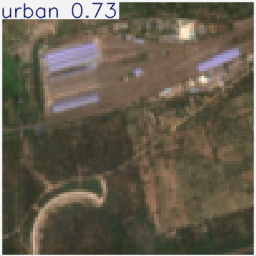

Predicting on: /content/sat_dataset/images/val/agriculture/agriculture_69.png

image 1/1 /content/sat_dataset/images/val/agriculture/agriculture_69.png: 256x256 1 agriculture, 69.6ms
Speed: 0.9ms preprocess, 69.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 256)


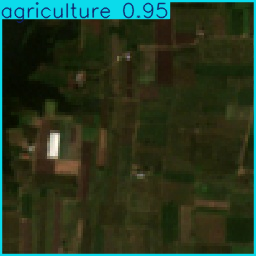

Predicting on: /content/sat_dataset/images/val/water/water_64.png

image 1/1 /content/sat_dataset/images/val/water/water_64.png: 256x256 1 water, 64.8ms
Speed: 0.8ms preprocess, 64.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 256)


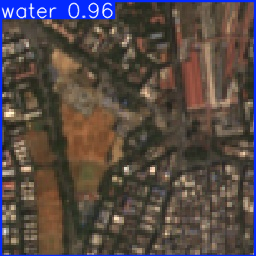

Predicting on: /content/sat_dataset/images/val/water/water_20.png

image 1/1 /content/sat_dataset/images/val/water/water_20.png: 256x256 1 water, 72.1ms
Speed: 0.9ms preprocess, 72.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 256)


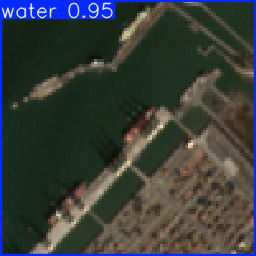

Predicting on: /content/sat_dataset/images/val/agriculture/agriculture_64.png

image 1/1 /content/sat_dataset/images/val/agriculture/agriculture_64.png: 256x256 1 agriculture, 75.8ms
Speed: 1.1ms preprocess, 75.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 256)


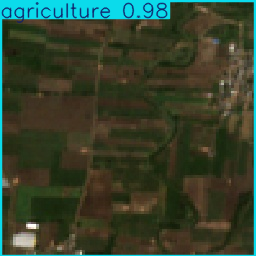

In [ ]:
# Step 0: Install required libraries
!pip install -q earthengine-api ultralytics opencv-python albumentations

# Step 1: Authenticate Earth Engine
import ee
ee.Authenticate()
ee.Initialize(project='daia-476208')

# Step 2: Imports
import os
import random
import numpy as np
from PIL import Image as PILImage
from io import BytesIO
import requests
from ultralytics import YOLO

# Step 3: Define bounding boxes (regions) for each class
regions = {
    "water": ee.Geometry.Rectangle([72.8, 18.9, 73.0, 19.2]),        # Mumbai coast
    "agriculture": ee.Geometry.Rectangle([75.0, 19.8, 75.6, 20.2]),  # Rural Maharashtra
    "urban": ee.Geometry.Rectangle([77.0, 28.4, 77.3, 28.8])         # Delhi urban
}

NUM_SAMPLES = 70  # per class
BASE_DIR = "/content/sat_dataset"

for split in ["train", "val"]:
    for cls in regions:
        os.makedirs(f"{BASE_DIR}/images/{split}/{cls}", exist_ok=True)
        os.makedirs(f"{BASE_DIR}/labels/{split}/{cls}", exist_ok=True)

# Step 4: Download Sentinel-2 RGB patch
def download_patch(lat, lon, size=256):
    point = ee.Geometry.Point([lon, lat])
    collection = (
        ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
        .filterBounds(point)
        .filterDate('2024-01-01', '2024-12-31')
        .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20))
        .sort('CLOUDY_PIXEL_PERCENTAGE')
    )

    image = collection.first()
    if image is None:
        print(f"No image for {lat}, {lon}")
        return None

    image = image.select(['B4', 'B3', 'B2'])  # RGB bands
    try:
        url = image.getThumbURL({
            'region': point.buffer(500).bounds().getInfo()['coordinates'],
            'dimensions': size,
            'min': 0,
            'max': 3000
        })
        r = requests.get(url, timeout=15)
        r.raise_for_status()
        img = PILImage.open(BytesIO(r.content))
        return np.array(img)
    except Exception as e:
        print(f"Failed download at {lat}, {lon}: {e}")
        return None

# Step 5: Generate random points & save dataset
def save_dataset():
    for cls, region in regions.items():
        print(f"\nSampling points for {cls}...")
        # ✅ Correct usage of randomPoints
        pts = ee.FeatureCollection.randomPoints(region, NUM_SAMPLES, seed=42)
        coords = pts.getInfo()['features']

        for i, feat in enumerate(coords):
            lon, lat = feat['geometry']['coordinates']
            img = download_patch(lat, lon)
            if img is None:
                continue

            split = "train" if random.random() < 0.8 else "val"
            img_path = f"{BASE_DIR}/images/{split}/{cls}/{cls}_{i}.png"
            PILImage.fromarray(img).save(img_path)

            # Label file: full patch as one object
            label_path = f"{BASE_DIR}/labels/{split}/{cls}/{cls}_{i}.txt"
            with open(label_path, 'w') as f:
                f.write(f"{list(regions.keys()).index(cls)} 0.5 0.5 1.0 1.0\n")

save_dataset()

# Step 6: Create YOLOv8 dataset YAML
yaml_content = f"""
path: {BASE_DIR}
train: images/train
val: images/val

nc: {len(regions)}
names: {list(regions.keys())}
"""
with open(f"{BASE_DIR}/data.yaml", 'w') as f:
    f.write(yaml_content)

# Step 7: Train YOLOv8 model
model = YOLO("yolov8n.pt")  # small & fast
model.train(data=f"{BASE_DIR}/data.yaml", epochs=10, imgsz=256, batch=8)

# Step 8: Test multiple random validation images
import glob
val_imgs = glob.glob(f"{BASE_DIR}/images/val/*/*.png")

if len(val_imgs) > 0:
    # Select up to 8 random images (or fewer if not enough available)
    sample_imgs = random.sample(val_imgs, min(8, len(val_imgs)))
    print(f"Testing on {len(sample_imgs)} validation images...")

    for img_path in sample_imgs:
        print("Predicting on:", img_path)
        results = model.predict(img_path, imgsz=256, conf=0.25)
        for r in results:
            r.show()  # Displays the result with bounding boxes
else:
    print("No validation images found. Try re-running dataset generation.")


Saving download (1).jpeg to download (1).jpeg
Running detection on: download (1).jpeg

image 1/1 /content/download (1).jpeg: 160x256 1 urban, 34.3ms
Speed: 2.2ms preprocess, 34.3ms inference, 0.8ms postprocess per image at shape (1, 3, 160, 256)


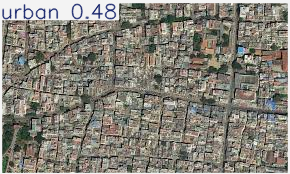

✅ Inference complete. Check the image preview or 'pred_<filename>' in files.


In [ ]:
# 🖼️ Upload and run inference on a custom image
from google.colab import files
uploaded = files.upload()  # choose an image from your system

for filename in uploaded.keys():
    print(f"Running detection on: {filename}")
    results = model.predict(source=filename, imgsz=256, conf=0.25)
    results[0].show()  # show prediction
    # Optional: save result image
    results[0].save(filename=f"pred_{filename}")

print("✅ Inference complete. Check the image preview or 'pred_<filename>' in files.")


Saving Screenshot 2025-10-29 002517.png to Screenshot 2025-10-29 002517.png
Running detection on: Screenshot 2025-10-29 002517.png

image 1/1 /content/Screenshot 2025-10-29 002517.png: 256x256 1 water, 46.7ms
Speed: 1.3ms preprocess, 46.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 256)


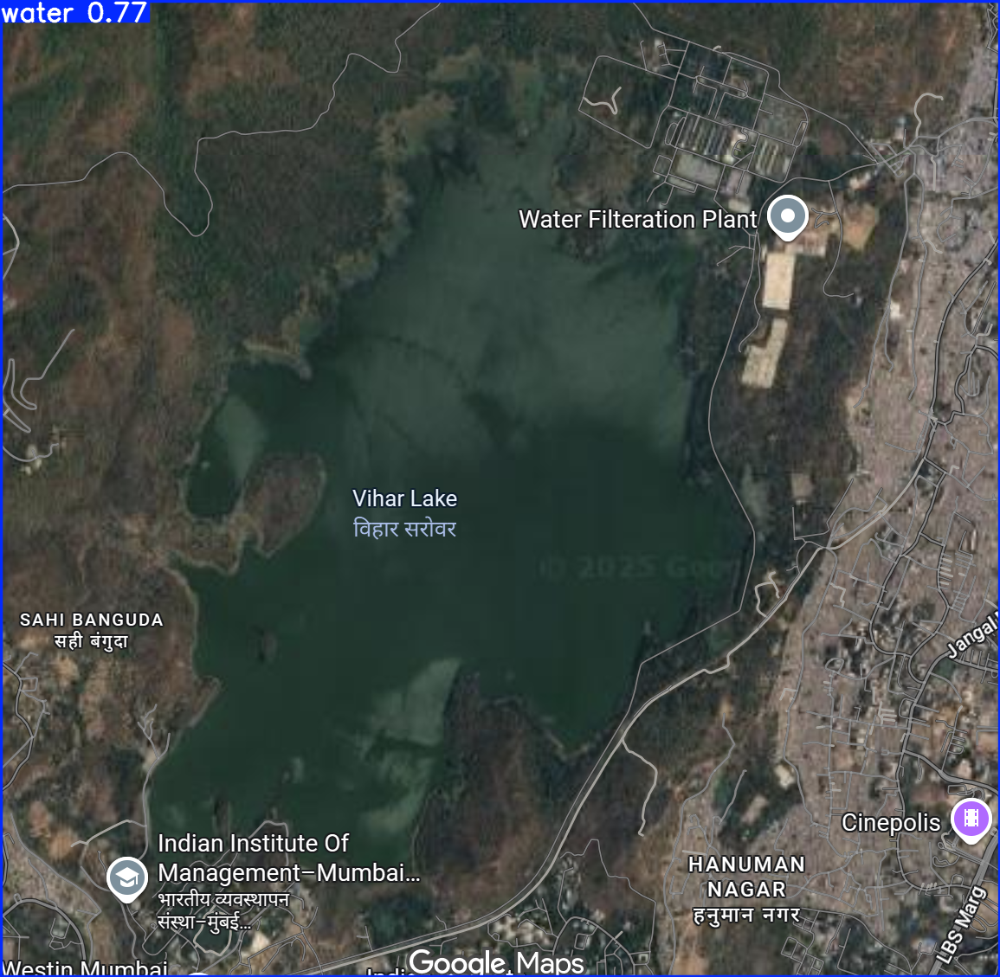

✅ Inference complete. Check the image preview or 'pred_<filename>' in files.


In [ ]:
# 🖼️ Upload and run inference on a custom image
from google.colab import files
uploaded = files.upload()  # choose an image from your system

for filename in uploaded.keys():
    print(f"Running detection on: {filename}")
    results = model.predict(source=filename, imgsz=256, conf=0.25)
    results[0].show()  # show prediction
    # Optional: save result image
    results[0].save(filename=f"pred_{filename}")

print("✅ Inference complete. Check the image preview or 'pred_<filename>' in files.")


Saving Screenshot 2025-10-29 002643.png to Screenshot 2025-10-29 002643.png
Running detection on: Screenshot 2025-10-29 002643.png

image 1/1 /content/Screenshot 2025-10-29 002643.png: 256x256 1 water, 43.1ms
Speed: 1.3ms preprocess, 43.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 256)


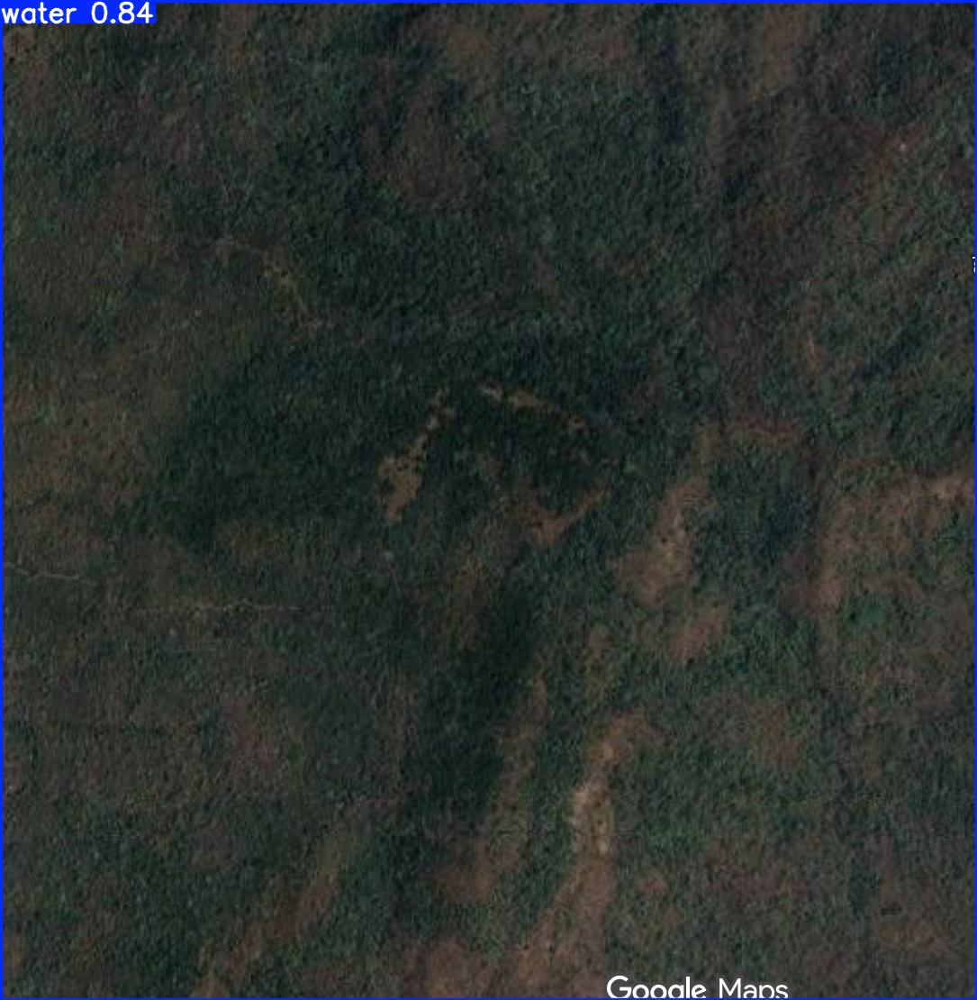

✅ Inference complete. Check the image preview or 'pred_<filename>' in files.


In [ ]:
# 🖼️ Upload and run inference on a custom image
from google.colab import files
uploaded = files.upload()  # choose an image from your system

for filename in uploaded.keys():
    print(f"Running detection on: {filename}")
    results = model.predict(source=filename, imgsz=256, conf=0.25)
    results[0].show()  # show prediction
    # Optional: save result image
    results[0].save(filename=f"pred_{filename}")

print("✅ Inference complete. Check the image preview or 'pred_<filename>' in files.")


Saving Screenshot 2025-10-29 002643.png to Screenshot 2025-10-29 002643.png
Running detection on: Screenshot 2025-10-29 002643.png

image 1/1 /content/Screenshot 2025-10-29 002643.png: 256x256 1 water, 1 urban, 62.5ms
Speed: 1.9ms preprocess, 62.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 256)


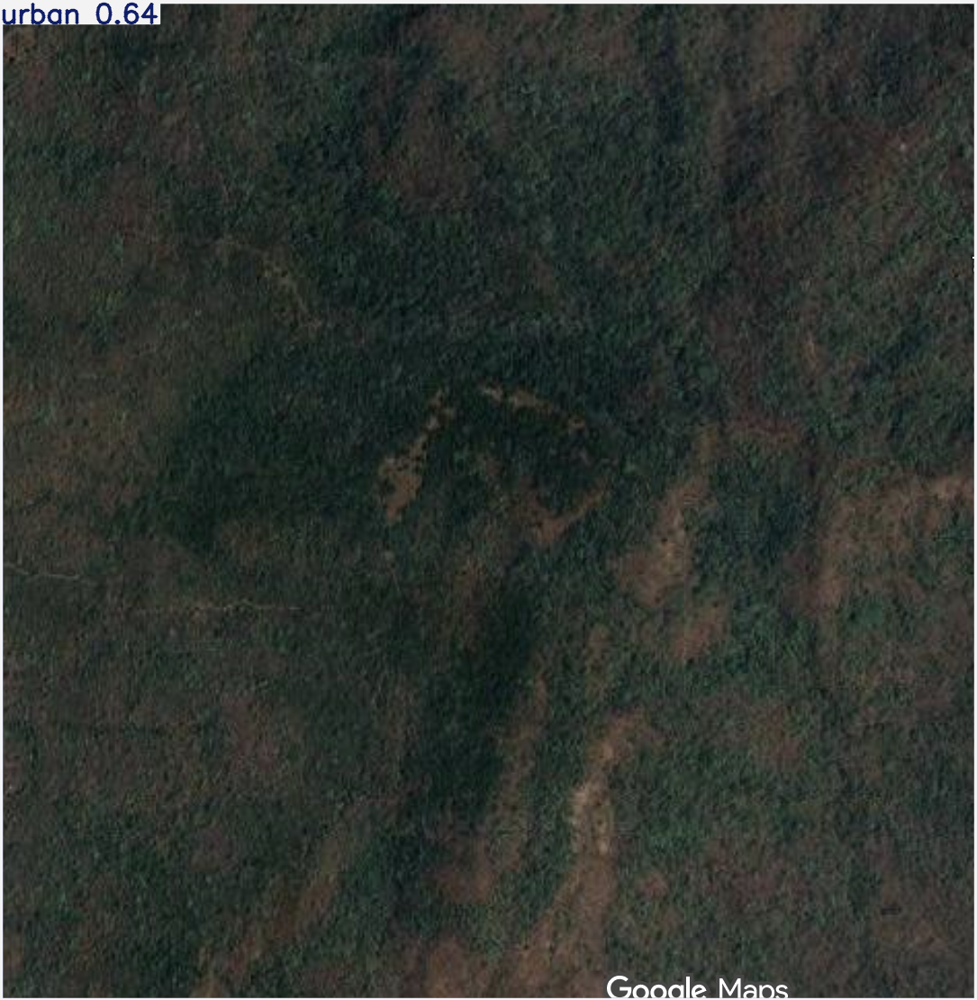

✅ Inference complete. Check the image preview or 'pred_<filename>' in files.


In [ ]:
# 🖼️ Upload and run inference on a custom image
from google.colab import files
uploaded = files.upload()  # choose an image from your system

for filename in uploaded.keys():
    print(f"Running detection on: {filename}")
    results = model.predict(source=filename, imgsz=256, conf=0.25)
    results[0].show()  # show prediction
    # Optional: save result image
    results[0].save(filename=f"pred_{filename}")

print("✅ Inference complete. Check the image preview or 'pred_<filename>' in files.")


Saving Screenshot 2025-11-01 000833.png to Screenshot 2025-11-01 000833.png
Running detection on: Screenshot 2025-11-01 000833.png

image 1/1 /content/Screenshot 2025-11-01 000833.png: 160x256 1 water, 62.3ms
Speed: 1.4ms preprocess, 62.3ms inference, 1.3ms postprocess per image at shape (1, 3, 160, 256)


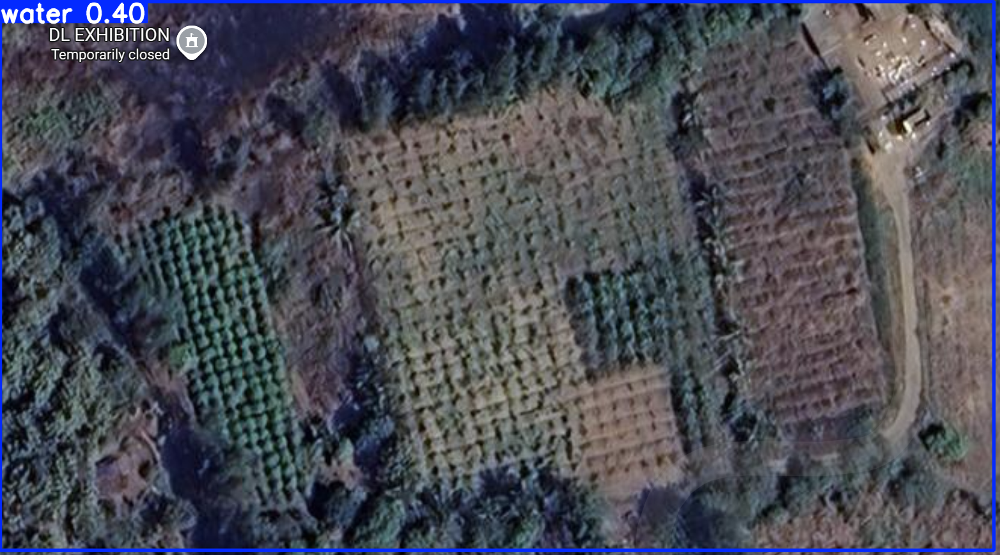

✅ Inference complete. Check the image preview or 'pred_<filename>' in files.


In [ ]:
# 🖼️ Upload and run inference on a custom image
from google.colab import files
uploaded = files.upload()  # choose an image from your system

for filename in uploaded.keys():
    print(f"Running detection on: {filename}")
    results = model.predict(source=filename, imgsz=256, conf=0.25)
    results[0].show()  # show prediction
    # Optional: save result image
    results[0].save(filename=f"pred_{filename}")

print("✅ Inference complete. Check the image preview or 'pred_<filename>' in files.")
